In [1]:
# importing packages and modules
import numpy as np
import jax.numpy as jnp
#import autograd.numpy as jnp
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.optimize import minimize, check_grad
from utils import *
from plotting_utils import *
from analysis_utils import *
import dglm_hmm1
from scipy.stats import multivariate_normal, norm
from jax import value_and_grad
#from autograd import value_and_grad

sns.set_context("talk")

In [2]:
# setting hyperparameters
S = 10 # sessions
T = 1000 # trials per session
N = T * S # total data points
C = 2 # classes
K = 2 # states
D = 2 # features (sensory & bias)

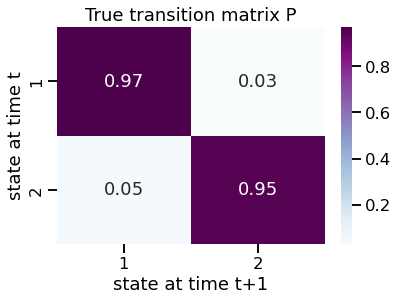

In [3]:
# True Transition Matrix
# trueP = jnp.zeros((2,2))
# trueP = trueP.at[0,0].set(0.97)
# trueP = trueP.at[0,1].set(0.03)
# trueP = trueP.at[1,0].set(.05)
# trueP = trueP.at[1,1].set(.95)
trueP = np.zeros((2,2))
trueP[0,0]=0.97
trueP[0,1]=0.03
trueP[1,0]=.05
trueP[1,1]=.95
plot_transition_matrix(trueP, title='True')

Session indicies
[0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
[0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]
(10000, 2, 2, 2)


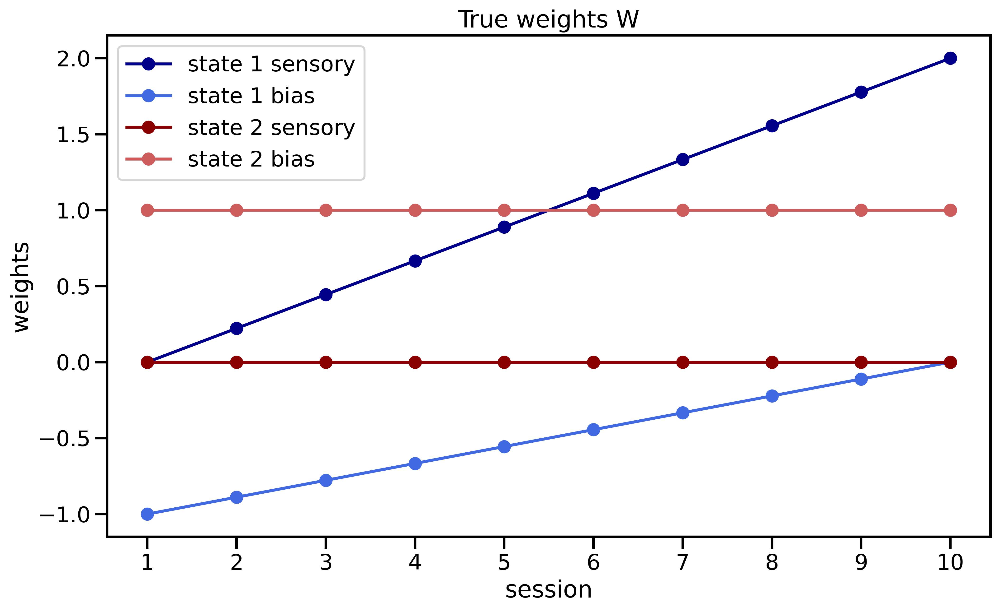

In [4]:
# True Weights and Session Start Indices
ourW = np.zeros((S,K,D))
ourW[:,0,1] = np.linspace(0,2,S) # state 1 sensory (increasing)
ourW[:,0,0] = np.linspace(-1,0,S) # state 1 bias (decreasing)
ourW[:,1,1] = 0 # state 2 sensory (flat 0)
ourW[:,1,0] = 1 # state 2 bias (flat 1)
trueW = np.zeros((N,K,D,C))
# change weight format to have session*trials points
sessInd = []
for sess in range(0,S):
    sessInd.append(sess*T)
    for t in range(0,T):
        trueW[sess*T+t,:,:,1] = ourW[sess,:,:]
sessInd.append(N)
print("Session indicies")
print(sessInd)
# ourW = jnp.zeros((S,K,D))
# ourW = ourW.at[:,0,1].set(jnp.linspace(0,2,S)) # state 1 sensory (increasing)
# ourW = ourW.at[:,0,0].set(jnp.linspace(1,0,S)) # state 1 bias (decreasing)
# ourW = ourW.at[:,1,1].set(0) # state 2 sensory (flat 0)
# ourW = ourW.at[:,1,0].set(1) # state 2 bias (flat 1)
# trueW = jnp.zeros((N,K,D,C))
# # change weight format to have session*trials points
# sessInd = []
# for sess in range(0,S):
#     sessInd.append(sess*T)
#     for t in range(0,T):
#         trueW = trueW.at[sess*T+t,:,:,0].set(ourW[sess,:,:])
# sessInd.append(N)
# print("Session indicies")
print(sessInd)

testSessInd = []
for sess in range(0,S+1):
    testSessInd.append(sess*1000)

print(trueW.shape)
fig, axes = plt.subplots(1, figsize = (12,7), dpi=400)
plotting_weights(w=trueW, sessInd=sessInd, axes=axes, trueW=None, title='True weights W', save_fig=False)

In [5]:
truepi = np.ones((K))/K

In [9]:
dGLM_HMM = dglm_hmm1.dGLM_HMM1(N,K,D,C)
# x, y, _ = dGLM_HMM.simulate_data(trueW, trueP, truepi, sessInd, save=True, title=f'/N={N}_{K}_state_constant-drift_')
x = np.load(f'../data_M1/N={N}_{K}_state_constant-drift_x.npy')
y = np.load(f'../data_M1/N={N}_{K}_state_constant-drift_y.npy')


# Checking whole dataset fit

In [16]:
# ourSigma = np.zeros((2,2)) # k x d
# ourSigma[0,0] = 0.11
# ourSigma[0,1] = 0.22
# ourSigma[1,0] = 0.01
# ourSigma[1,1] = 0.01
oneSessInd = [0,N]
present = np.ones((N)).astype(int) # using all data
initP0, initpi0, initW0 = dGLM_HMM.generate_param(sessInd=oneSessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) 
initP, initpi, initW, _ = dGLM_HMM.fit(x, y, present, initP0, initpi0, initW0, sigma=reshapeSigma(0, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # sigma does not matter here
checkP, checkpi, checkW, _ = dGLM_HMM.fit(x, y, present, initP=initP, initpi=initpi, initW=initW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, maxIter=250, tol=1e-4, priorDirP=None, fit_init_states=False) # fit the model
# print(checkP)
# print(checkpi)

In [10]:
# sortedStateInd = get_states_order(checkW, sessInd, stimCol=[1])
# fig, axes = plt.subplots()
# plot_transition_matrix(initP, f'recovered P', sortedStateInd=sortedStateInd)
# fig, axes = plt.subplots()
# plot_transition_matrix(checkP, f'recovered P', sortedStateInd=sortedStateInd)

In [11]:
# fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
# plotting_weights(initW, sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0', save_fig=False, sortedStateInd=sortedStateInd)
# fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
# plotting_weights(checkW, sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2', save_fig=False, sortedStateInd=sortedStateInd)

# Checking CV fitting

In [35]:
splitFolds = 5
dGLM_HMM = dglm_hmm1.dGLM_HMM1(N,K,D,C)
x, y, _ = dGLM_HMM.simulate_data(trueW, trueP, truepi, sessInd, save=False, title=f'/N={N}_{K}_state_constant-drift_train')
presentTrain, presentTest = split_data(x, y, sessInd, folds=splitFolds, blocks=10, random_state=1)

maxiter = 250
allLl = np.zeros((splitFolds, maxiter))
allP = np.zeros((splitFolds, K, K))
allW = np.zeros((splitFolds, N, K, D, C))

oneSessInd = [0,N]
present = np.ones((N)).astype(int) # using all data for sigma=0 fit
initP0, initpi0, initW0 = dGLM_HMM.generate_param(sessInd=oneSessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) 
initP, initpi, initW, _ = dGLM_HMM.fit(x, y, present, initP0, initpi0, initW0, sigma=reshapeSigma(0, K, D), sessInd=sessInd, maxIter=maxiter, tol=1e-4, priorDirP=None, fit_init_states=False) # sigma does not matter here

fitFolds = 5
for fold in range(0, fitFolds):
    allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM.fit(x, y, presentTrain[fold], initP=initP, initpi=initpi, initW=initW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, maxIter=maxiter, tol=1e-4, priorDirP=None, fit_init_states=False) # fit the model
    
    # WORKS!
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM.fit(x, y, presentTrain[fold], initP=trueP, initpi=truepi, initW=trueW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, maxIter=maxiter, tol=1e-4, priorDirP=None, fit_init_states=False) # fit the model

    # WORKS!
    # allP[fold], _, allW[fold], allLl[fold] = dGLM_HMM.fit(x, y, presentTrain[fold], initP=initP0, initpi=initpi0, initW=trueW, sigma=reshapeSigma(0.2, K, D), sessInd=sessInd, maxIter=maxiter, tol=1e-4, priorDirP=None, fit_init_states=False) # fit the model
    
        

In [12]:
# sortedStateInd = get_states_order(initW, sessInd, stimCol=[1])
# fig, axes = plt.subplots()
# plot_transition_matrix(initP, f'recovered P sigma=0', sortedStateInd=sortedStateInd)
# fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
# plotting_weights(initW, sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0', save_fig=False, sortedStateInd=sortedStateInd)
# for fold in range(0, fitFolds):
#     sortedStateInd = get_states_order(allW[fold], sessInd, stimCol=[1])
#     fig, axes = plt.subplots()
#     plot_transition_matrix(allP[fold], f'recovered P fold {fold}', sortedStateInd=sortedStateInd)
#     fig, axes = plt.subplots(1, figsize = (14,8), dpi=400)
#     plotting_weights(allW[fold], sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma=0.2 fold {fold}/{splitFolds}', save_fig=False, sortedStateInd=sortedStateInd)

In [37]:
presentTrain, presentTest = split_data(x, y, sessInd, folds=splitFolds, blocks=10, random_state=1)
llTest = np.zeros((fitFolds))
accuracyTest = np.zeros((fitFolds))
mseWeights = np.zeros((fitFolds))
for fold in range(0, fitFolds):
    llTest[fold], accuracyTest[fold] = dGLM_HMM.evaluate(x,y, presentTest[fold], allP[fold], initpi0, allW[fold], sessInd)
print(np.round(llTest,3))
print(np.round(accuracyTest, 3))

[-0.616 -0.617 -0.614 -0.612 -0.61 ]
[74.5  74.08 74.2  74.72 74.69]


# Multiple Sigmas Fitting - most recent version in Figure2 notebook

# multiple sigma fitting

In [29]:
sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
dGLM_HMM = dglm_hmm1.dGLM_HMM1(N,3,D,C) # fitting with one state the two state model
inits=1
maxiter=300
modelType='constant-drift'
simX = np.load(f'../data/N={N}_{K}_state_{modelType}_trainX.npy')
simY = np.load(f'../data/N={N}_{K}_state_{modelType}_trainY.npy')

allLl = np.zeros((inits, len(sigmaList), maxiter))
allP = np.zeros((inits, len(sigmaList), 3,3))
allW = np.zeros((inits, len(sigmaList),N,3,D,C))

oneSessInd = [0,N] # treating whole dataset as one session for normal GLM-HMM fitting
 
for init in range(0,inits):
    for indSigma in range(0,len(sigmaList)): 
        print(indSigma)
        if (indSigma == 0): 
            if(sigmaList[0] == 0):
                initP0, initW0 = dGLM_HMM.generate_param(sessInd=oneSessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) 
                allP[init, indSigma],  allW[init, indSigma], allLl[init, indSigma] = dGLM_HMM.fit(simX, simY,  initP0, initW0, sigma=reshapeSigma(1, 3, D), sessInd=oneSessInd, pi0=None, maxIter=300, tol=1e-4) # sigma does not matter here
            else:
                initP, initW = dGLM_HMM.generate_param(sessInd=sessInd, transitionDistribution=['dirichlet', (5, 1)], weightDistribution=['uniform', (-2,2)]) # initialize the model parameters
        else:
            initP = allP[init, indSigma-1] 
            initW = allW[init, indSigma-1] 
            
        if(sigmaList[indSigma] != 0):
            # fit on whole dataset
            allP[init, indSigma],  allW[init, indSigma], allLl[init, indSigma] = dGLM_HMM.fit(simX, simY,  initP, initW, sigma=reshapeSigma(sigmaList[indSigma], 3, D), sessInd=sessInd, pi0=None, maxIter=maxiter, tol=1e-3) # fit the model
                
    np.save(f'../data/Ll_N={N}_3-fit_{K}_state_{modelType}', allLl)
    np.save(f'../data/P_N={N}_3-fit_{K}_state_{modelType}', allP)
    np.save(f'../data/W_N={N}_3-fit_{K}_state_{modelType}', allW)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


(1, 21, 5000, 3, 2, 2)
[2, 0, 1]


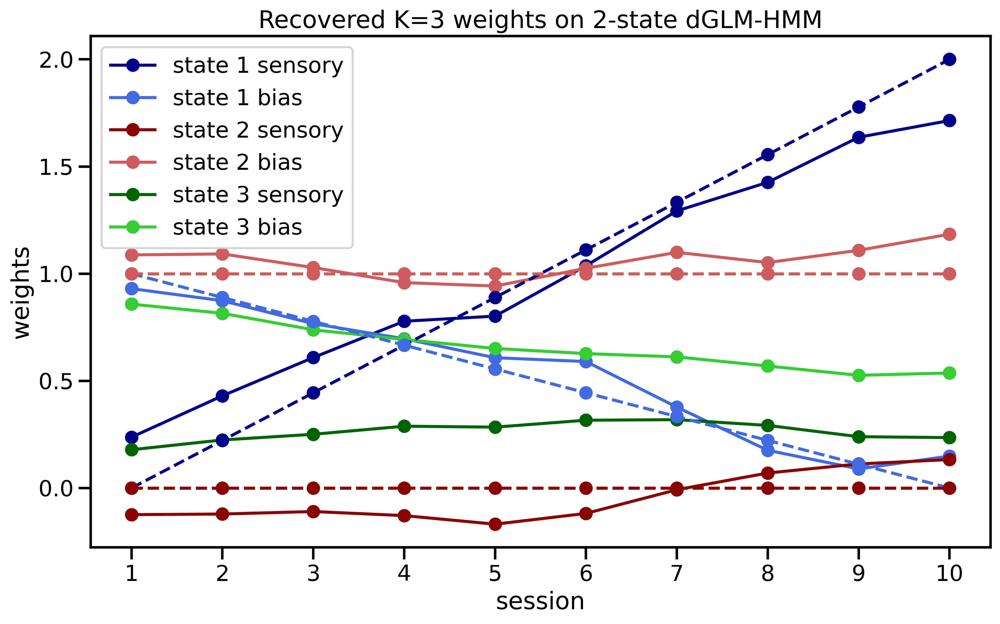

In [31]:
W = np.load(f'../data/W_N=5000_3-fit_2_state_constant-drift.npy')
print(W.shape)
sortedStateInd = permute_states(W[0,10],sessInd)
print(sortedStateInd)
fig, axes = plt.subplots(1, figsize = (12,7), dpi=400)
plotting_weights(w=W[0,10][:,sortedStateInd,:,:], sessInd=sessInd, axes=axes, trueW=trueW, title='Recovered K=3 weights on 2-state dGLM-HMM', save_fig=True)

(5000, 2, 2, 2)
[1, 0]


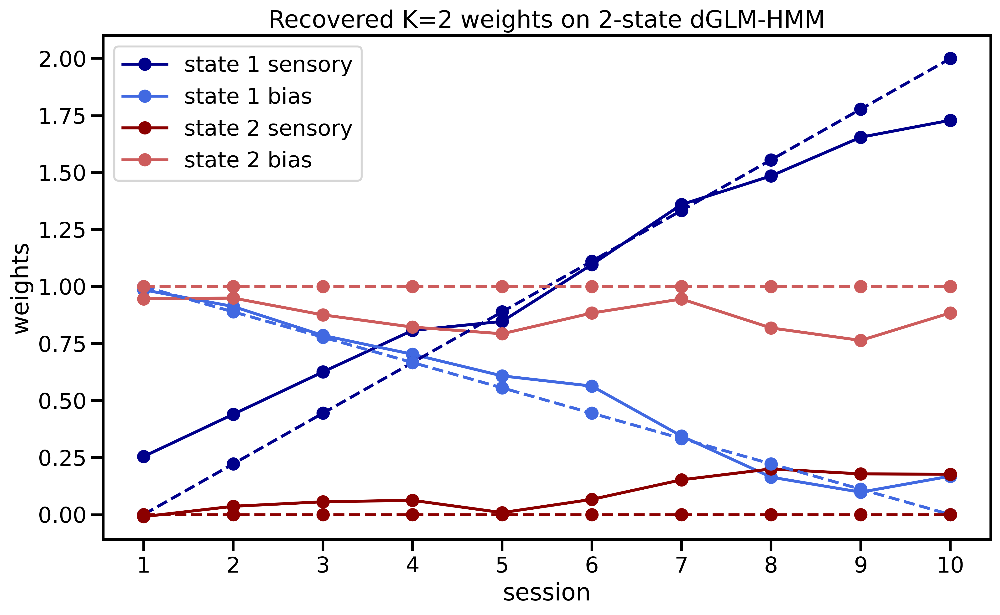

In [13]:
W = np.load(f'../data/W_N=5000_2_state_constant-drift.npy')
print(W[0,10].shape)
sortedStateInd = permute_states(W[0,10],sessInd)
print(sortedStateInd)
fig, axes = plt.subplots(1, figsize = (12,7), dpi=400)
plotting_weights(w=W[0,10][:,sortedStateInd,:,:], sessInd=sessInd, axes=axes, trueW=trueW, title='Recovered K=2 weights on 2-state dGLM-HMM', save_fig=True)

[1, 0]
[1 1 1 ... 0 0 1]


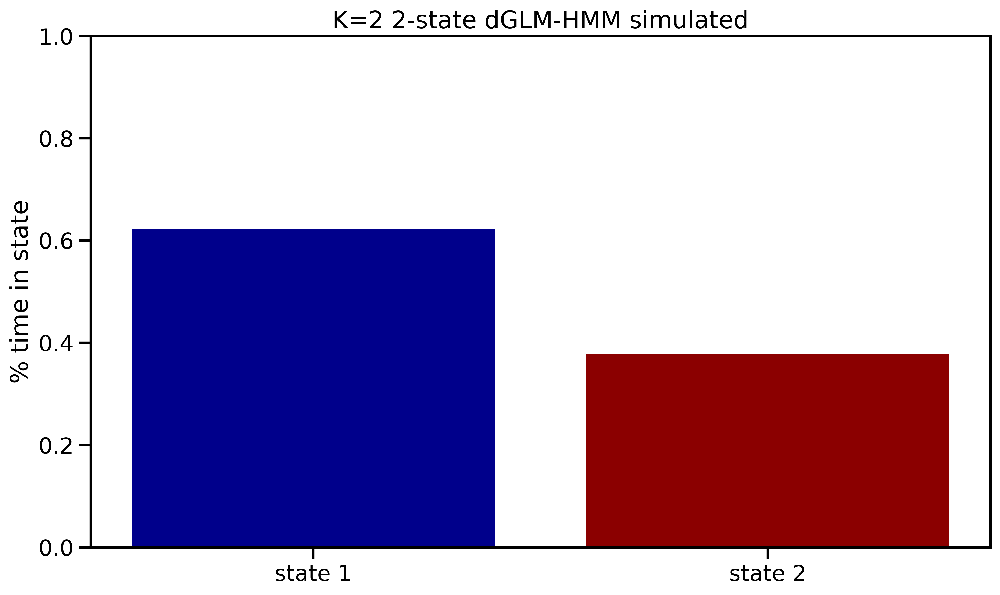

In [29]:
w = np.load(f'../data/W_N=5000_2_state_constant-drift.npy')
p = np.load(f'../data/P_N=5000_2_state_constant-drift.npy')
dGLM_HMM3 = dglm_hmm1.dGLM_HMM1(N,K,D,C)
sortedStateInd = permute_states(w[0,10],sessInd)
print(sortedStateInd)
z = dGLM_HMM3.get_states_in_time(trainX, trainY, w[0,10][:,sortedStateInd,:,:], p[0,10][sortedStateInd,:][:,sortedStateInd], sessInd=sessInd)
print(z)

fig, axes = plt.subplots(1, figsize = (12,7), dpi=400)
plotting_state_occupancy(z, axes, title='K=2 2-state dGLM-HMM simulated', save_fig=True)
    

[2, 0, 1]
[[9.15204154e-01 9.02549205e-03 7.57703536e-02]
 [1.94802102e-02 9.80519790e-01 1.14933711e-31]
 [3.14642870e-02 9.43163145e-11 9.68535713e-01]]
[[9.68535713e-01 3.14642870e-02 9.43163145e-11]
 [7.57703536e-02 9.15204154e-01 9.02549205e-03]
 [1.14933711e-31 1.94802102e-02 9.80519790e-01]]


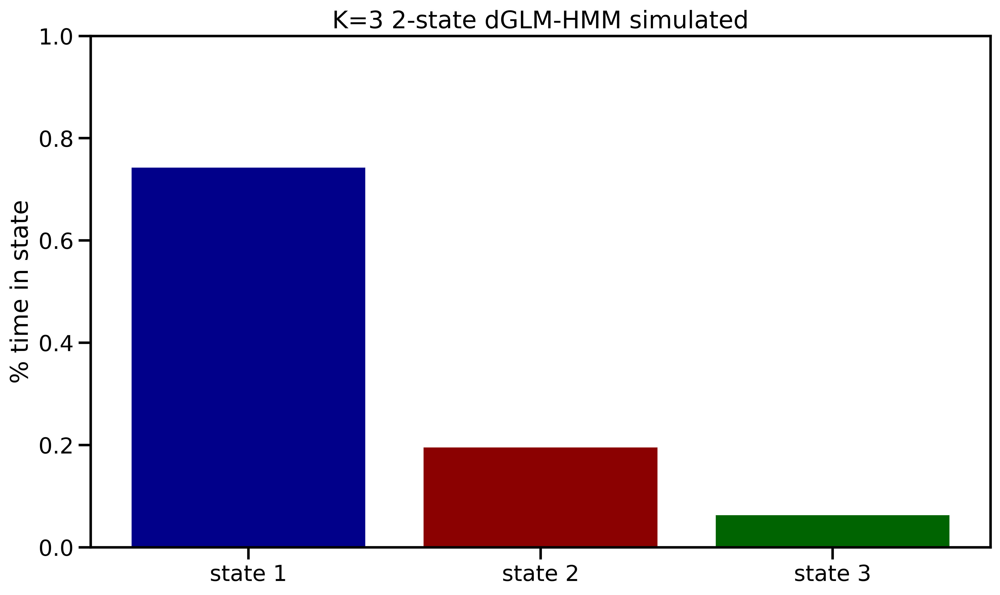

In [30]:
w = np.load(f'../data/W_N=5000_3-fit_2_state_constant-drift.npy')
p = np.load(f'../data/P_N=5000_3-fit_2_state_constant-drift.npy')
dGLM_HMM3 = dglm_hmm1.dGLM_HMM1(N,3,D,C)
sortedStateInd = permute_states(w[0,10],sessInd)
print(sortedStateInd)
z = dGLM_HMM3.get_states_in_time(trainX, trainY, w[0,10][:,sortedStateInd,:,:], p[0,10][sortedStateInd,:][:,sortedStateInd], sessInd=sessInd)
print(p[0,10])
print(p[0,10][sortedStateInd,:][:,sortedStateInd])

fig, axes = plt.subplots(1, figsize = (12,7), dpi=400)
plotting_state_occupancy(z, axes, title='K=3 2-state dGLM-HMM simulated', save_fig=True)

(1, 21)
(1, 21)
(1, 21)


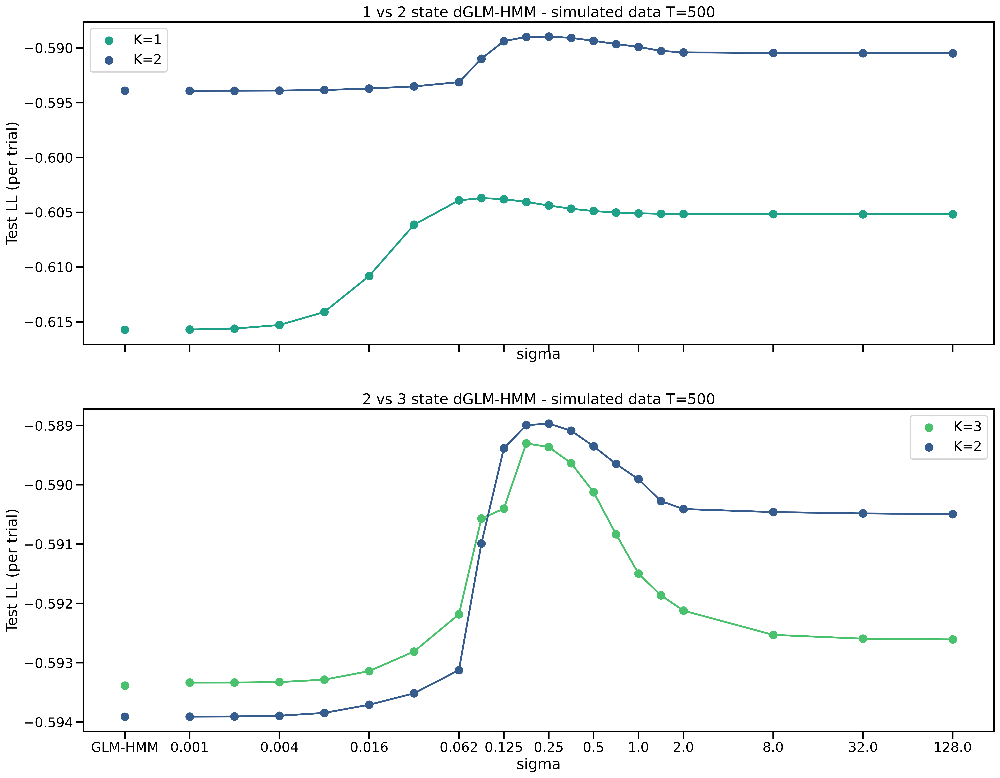

In [8]:
modelType='constant-drift'
sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
testLl1 = np.load(f'../data/testLl_N={N}_1-fit_{K}_state_{modelType}.npy')
print(testLl1.shape)
testLl2 = np.load(f'../data/testLl_N={N}_{K}_state_{modelType}.npy')
print(testLl2[0,:].reshape((1,21)).shape)
testLl3 = np.load(f'../data/testLl_N={N}_3-fit_{K}_state_{modelType}.npy')
print(testLl3.shape)
fig, axes = plt.subplots(2, 1, figsize = (20,16), dpi=400, sharex=True)
sigma_testLl_plot(K=1, sigmaList=sigmaList, testLl=testLl1, axes=axes[0], title='2 state dGLM-HMM - simulated data T=500', labels=['K=1'], color=3, save_fig=False)
sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl2[0,:].reshape((1,21)), axes=axes[0], title='1 vs 2 state dGLM-HMM - simulated data T=500', labels=['K=2'], color=1, save_fig=False)
sigma_testLl_plot(K=3, sigmaList=sigmaList, testLl=testLl3, axes=axes[1], title='2 state dGLM-HMM - simulated data T=500', labels=['K=3'], color=4, save_fig=False)
sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl2[0,:].reshape((1,21)), axes=axes[1], title='2 vs 3 state dGLM-HMM - simulated data T=500', labels=['K=2'], color=1, save_fig=True)


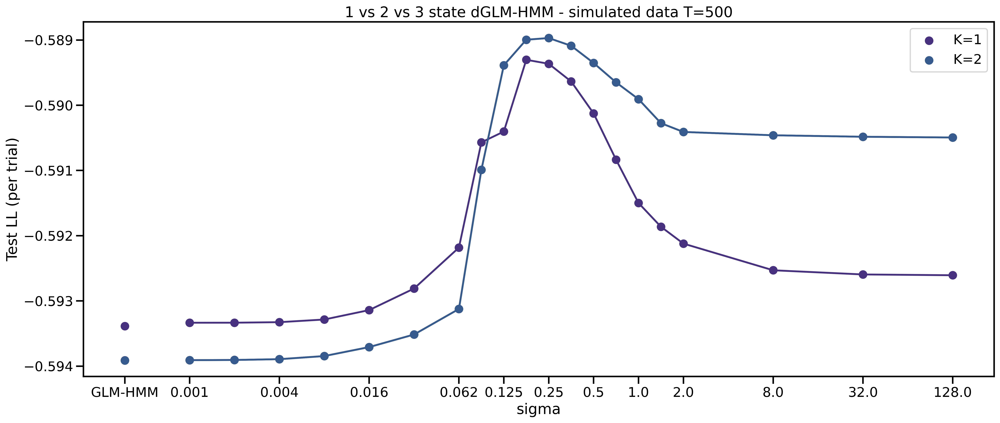

In [30]:
testX = np.load(f'../data/{K}_state_{modelType}_testX.npy')
testY = np.load(f'../data/{K}_state_{modelType}_testY.npy')
allP = np.load(f'../data/P_N={N}_3-fit_{K}_state_{modelType}.npy')
allW = np.load(f'../data/W_N={N}_3-fit_{K}_state_{modelType}.npy')
sess = 10
inits = 1
testLl = np.zeros((inits, len(sigmaList)))
dGLM_HMM = dglm_hmm1.dGLM_HMM1(N,3,D,C)
trainSessInd=sessInd
sessInd10000 = []
for sess in range(0,S+1):
    sessInd10000.append(sess*1000)
testSessInd=sessInd10000
# Evaluate on test data
for indSigma in range(0, len(sigmaList)):  
    for s in range(0, sess):
        # evaluate on test data for each session separately
        testPhi = dGLM_HMM.observation_probability(testX, reshapeWeights(allW[0,indSigma], trainSessInd, testSessInd))
        _, _, temp = dGLM_HMM.forward_pass(testY[testSessInd[s]:testSessInd[s+1]],allP[0,indSigma],testPhi[testSessInd[s]:testSessInd[s+1]])
        testLl[init, indSigma] += temp
    
testLl = testLl / testSessInd[-1] # normalizing to the total number of trials in test
np.save(f'../data/testLl_N={N}_3-fit_{K}_state_{modelType}', testLl)

fig, axes = plt.subplots(1, figsize = (20,8), dpi=400)
sigma_testLl_plot(K=1, sigmaList=sigmaList, testLl=testLl, axes=axes, title='2 state dGLM-HMM - simulated data T=500', labels=['K=1'], save_fig=False)
testLl = evaluate_multiple_sigmas_simulated(N,K,D,C, trainSessInd=sessInd, testSessInd=testSessInd, sigmaList = sigmaList, modelType='constant-drift', save=True)
sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl[0:2,0:len(sigmaList)], axes=axes, title='1 vs 2 vs 3 state dGLM-HMM - simulated data T=500', labels=['','K=2'], save_fig=True)


In [9]:
#Fitting for multiple values of Sigma 
sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
allLl, allP, allW = fit_multiple_sigmas_simulated(N=N,K=K,D=D,C=C, sessInd=sessInd, sigmaList=sigmaList, inits=1, maxiter=300, modelType='constant-drift', save=True)

0
0
10
20
30
40
50
1
0
10
2
0
10
3
0
10
4
0
10
20
30
40
5
0
10
20
30
40
50
60
6
0
10
20
30
40
50
60
70
80
90
7
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
8
0
10
20
30
40
50
60
70
80
90
100
9
0
10
20
10
0
10
11
0
10
12
0
10
13
0
10
14
0
10
15
0
10
16
0
10
17
0
10
18
0
10
19
0
10
20
0
10


In [19]:
print(allP[0,15])

[[0.95450338 0.04549662]
 [0.01874615 0.98125385]]


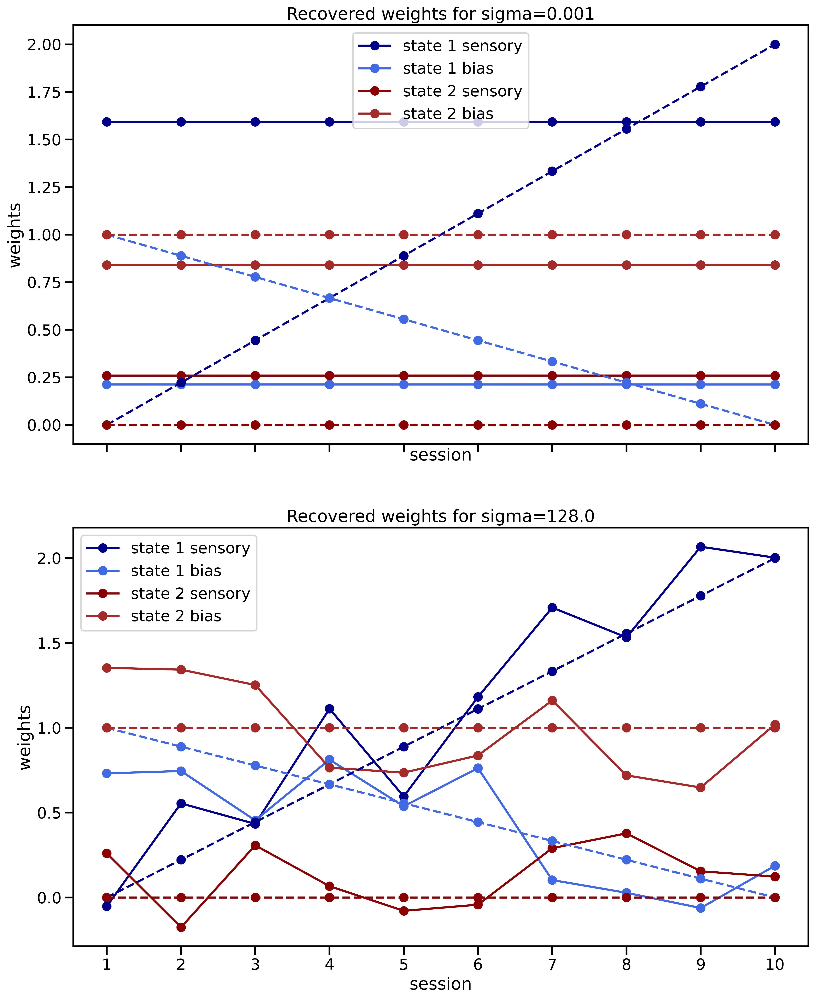

In [5]:
sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
allW = np.load('../data/W_N=5000_2_state_constant-drift.npy')
allP = np.load('../data/P_N=5000_2_state_constant-drift.npy')
init = 0
fig, axes = plt.subplots(2,1, sharex=True ,figsize = (14,18), dpi=400)
plotting_weights(allW[init, 1][:,[1,0],:,:], sessInd, axes=axes[0],  trueW=trueW, title=f'Recovered weights for sigma={np.round(sigmaList[1],3)}', save_fig=False)
plotting_weights(permute_states(allW[init, 20],sessInd), sessInd, axes=axes[1],  trueW=trueW, title=f'Recovered weights for sigma={np.round(sigmaList[20],3)}', save_fig=True)
# 10 or 11 are optimal sigmas
#plotting_weights(permute_states(allW[init, indSigma],sessInd), sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma={np.round(sigmaList[indSigma],3)}', save_fig=True)

/var/folders/w4/p225s7cd19n0j6tss7pdl21w0000gn/T/ipykernel_1737/1682761589.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, figsize = (8,5), dpi=400)


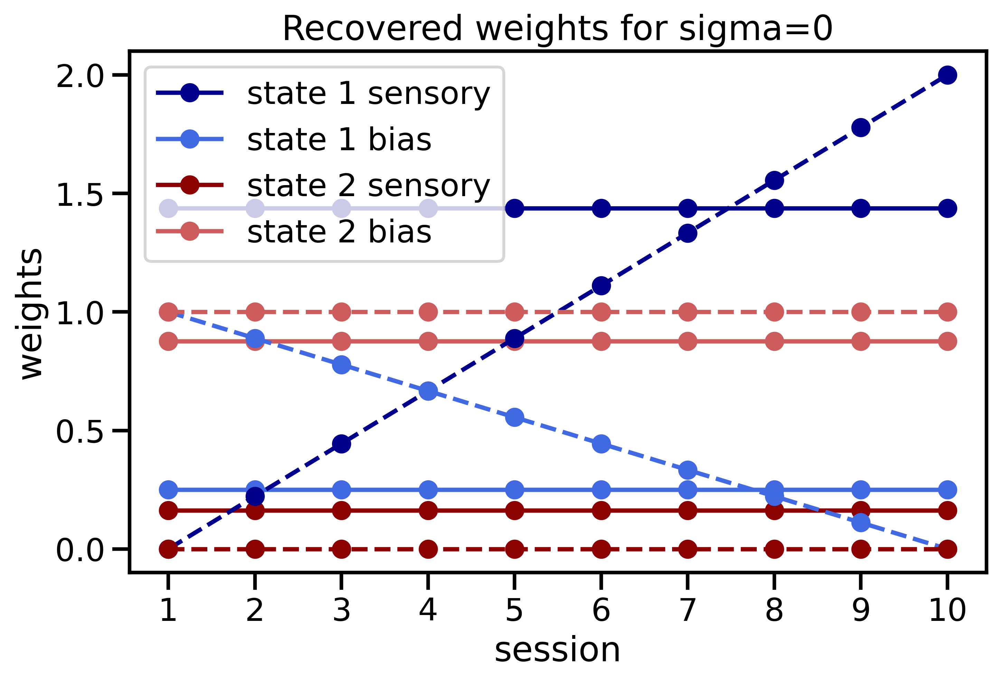

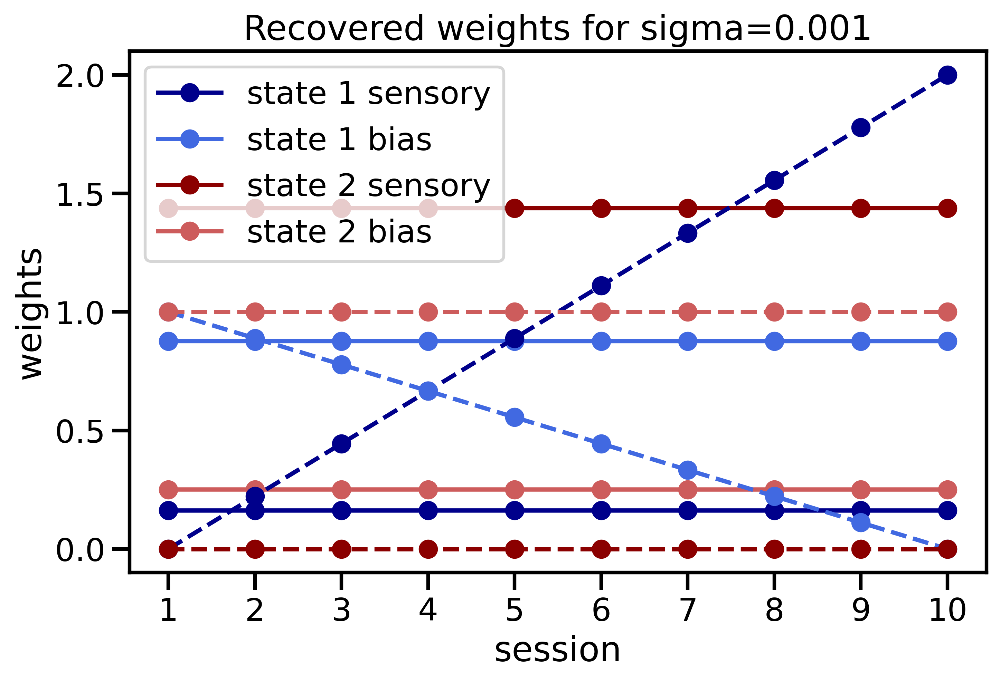

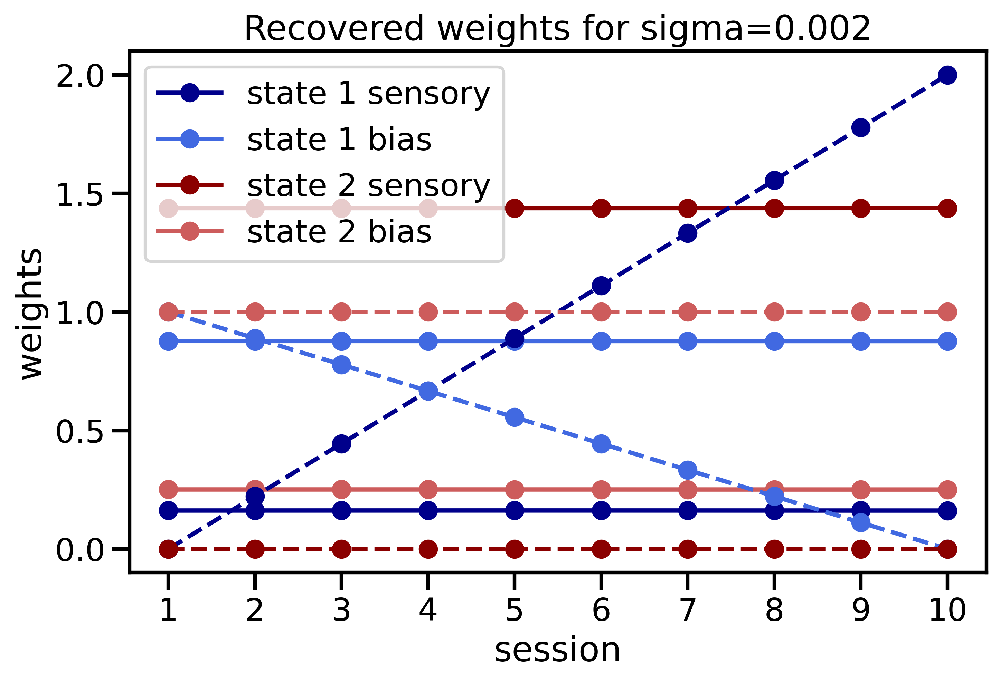

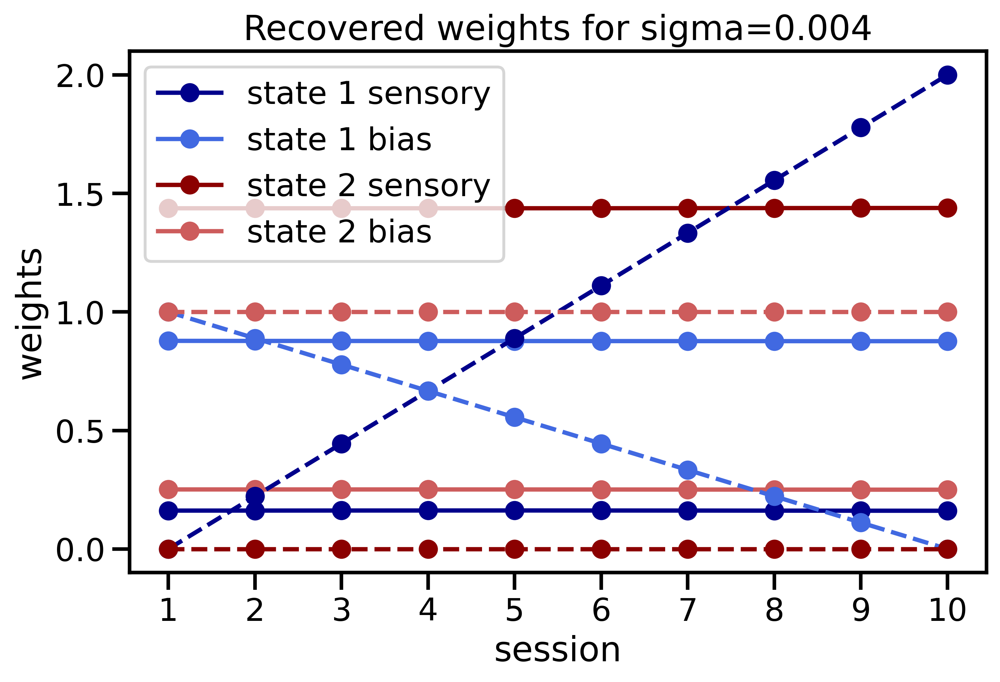

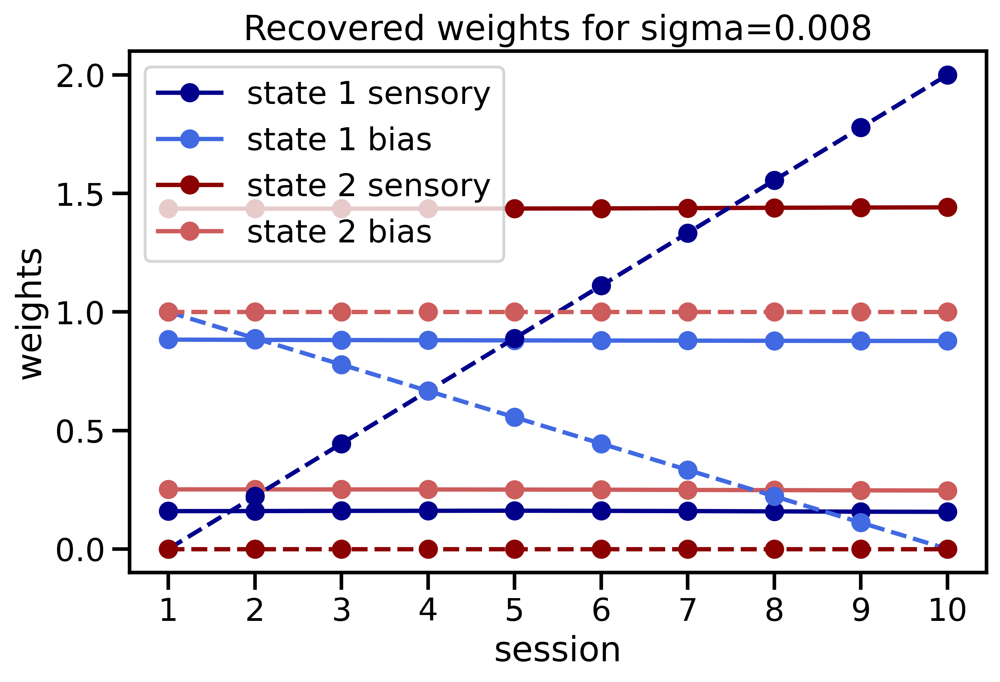

...

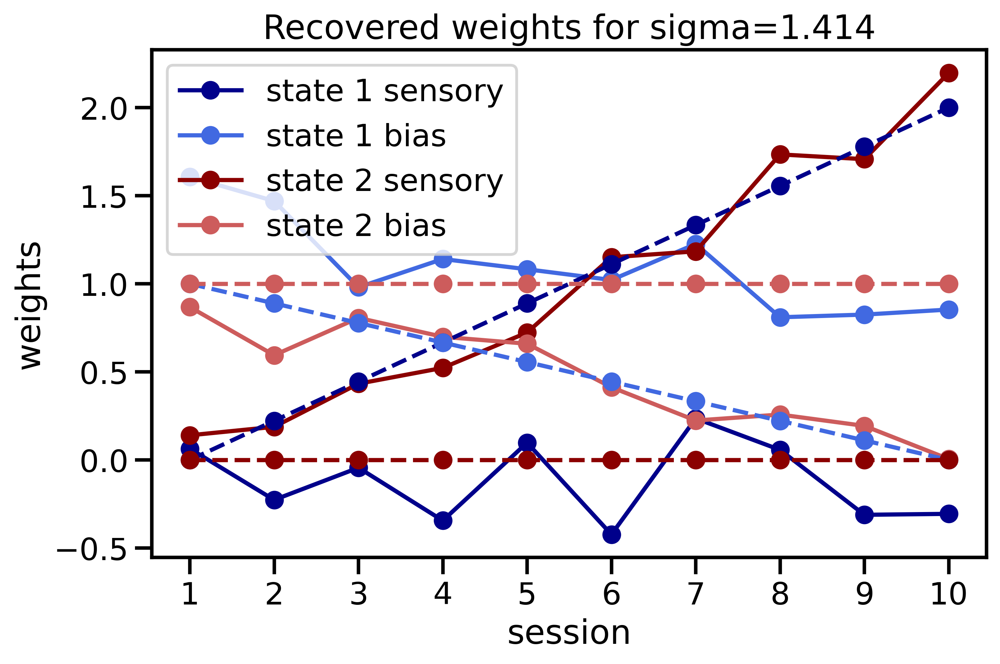

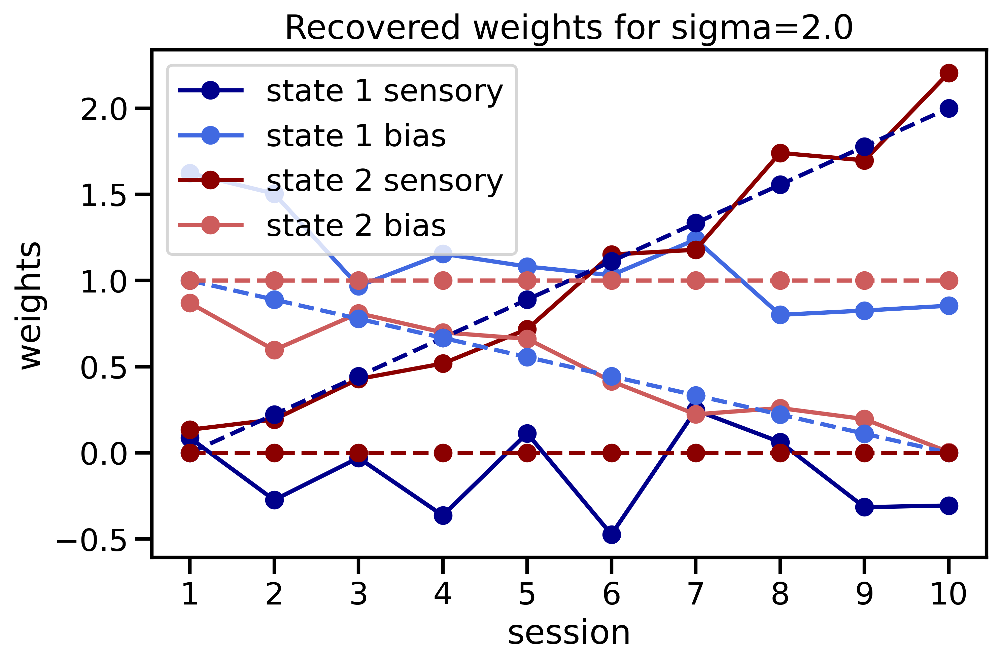

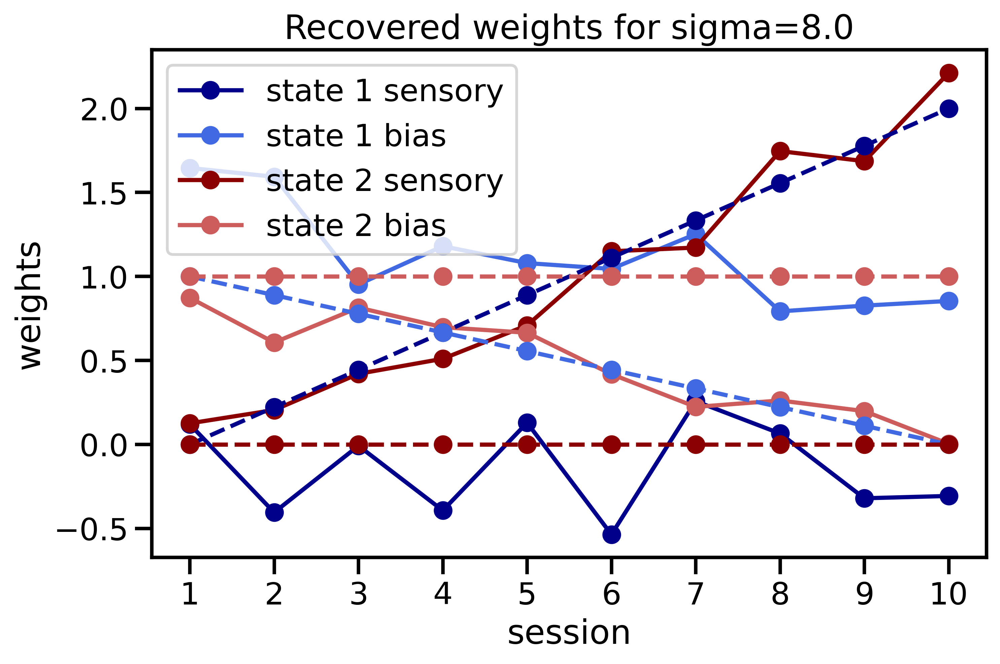

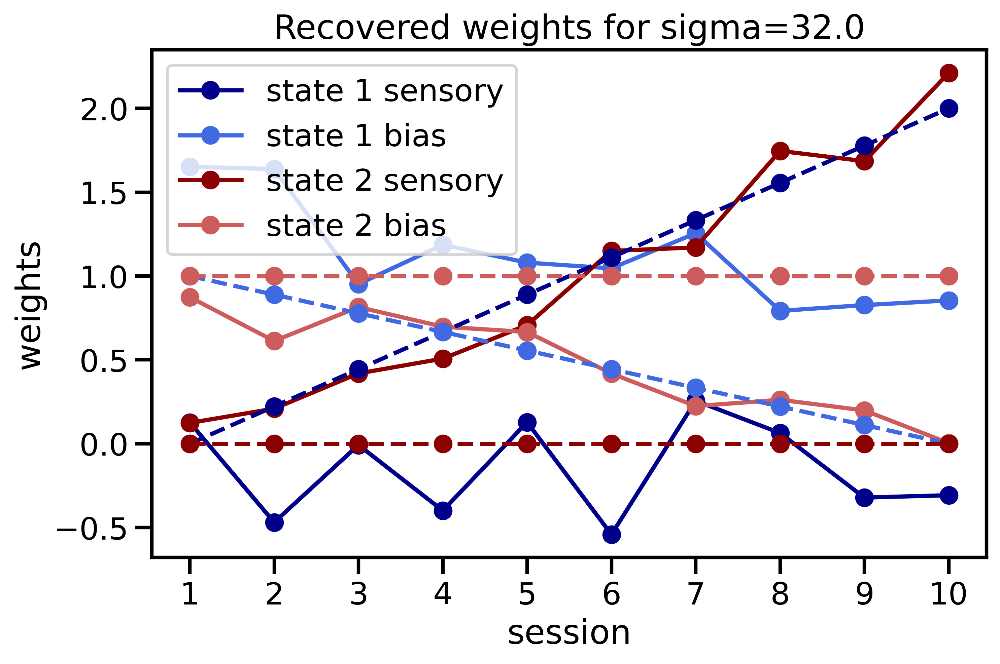

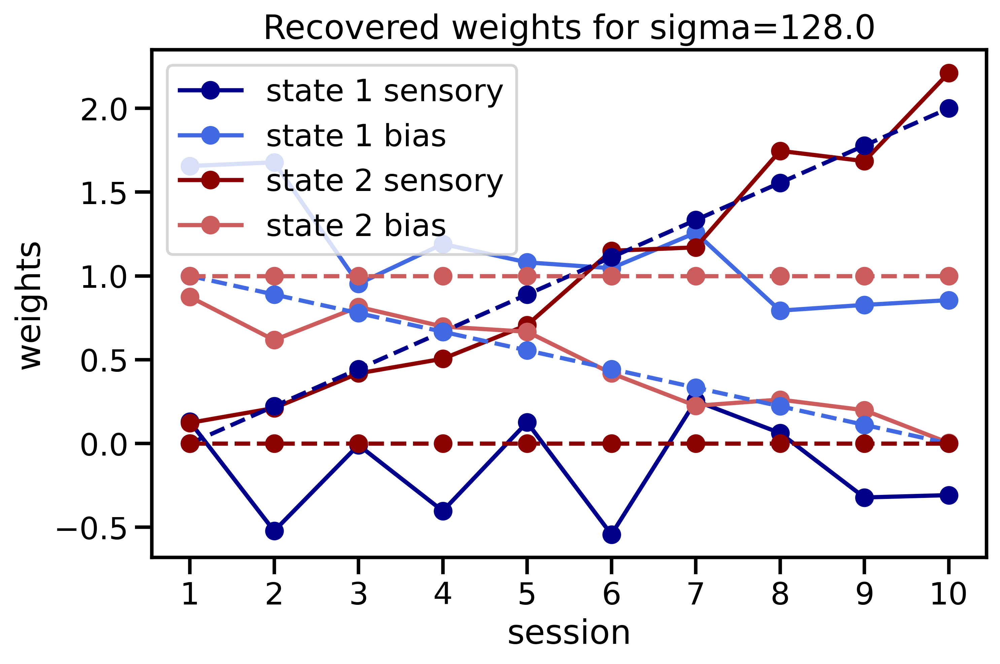

In [15]:
for indSigma in range(0,len(sigmaList)):
    fig, axes = plt.subplots(1, figsize = (16,10), dpi=400)
    plotting_weights(allW[0, indSigma], sessInd, axes=axes,  trueW=trueW, title=f'Recovered weights for sigma={np.round(sigmaList[indSigma],3)}', save_fig=False)

(1, 21)


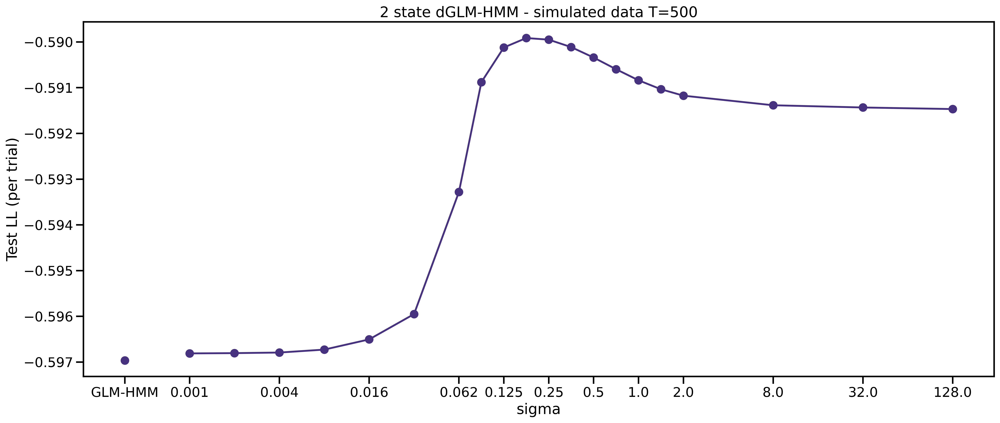

In [10]:
sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
testLl = evaluate_multiple_sigmas_simulated(N,K,D,C, trainSessInd=sessInd, testSessInd=testSessInd, sigmaList = sigmaList, modelType='constant-drift', save=False)
print(testLl.shape)

sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
fig, axes = plt.subplots(1, figsize = (20,8), dpi=400)
sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl[0:1,0:len(sigmaList)], axes=axes, title='2 state dGLM-HMM - simulated data T=500', labels=None, save_fig=False)


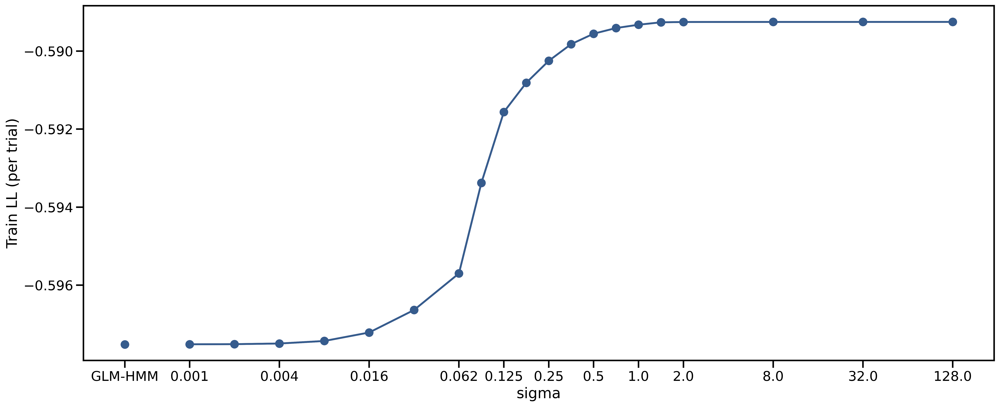

In [6]:
sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
modelType = 'constant-drift'
testX = np.load(f'../data/N={N}_{K}_state_{modelType}_trainX.npy')
testY = np.load(f'../data/N={N}_{K}_state_{modelType}_trainY.npy')
allP = np.load(f'../data/P_N={N}_{K}_state_{modelType}.npy')
allW = np.load(f'../data/W_N={N}_{K}_state_{modelType}.npy')
sess = 10
inits = allW.shape[0]
trainLl = np.zeros((inits, len(sigmaList)))
dGLM_HMM = dglm_hmm1.dGLM_HMM1(N,K,D,C)
# Evaluate on test data
for init in range(0,inits):
    for indSigma in range(0, len(sigmaList)):  
        for s in range(0, sess):
            # evaluate on test data for each session separately
            testPhi = dGLM_HMM.observation_probability(testX, allW[init, indSigma])
            _, _, temp = dGLM_HMM.forward_pass(testY[sessInd[s]:sessInd[s+1]],allP[init, indSigma],testPhi[sessInd[s]:sessInd[s+1]])
            trainLl[init, indSigma] += temp
    
trainLl = trainLl / sessInd[-1] # normalizing to the total number of trials in test
# np.save(f'../data/trainLl_N={N}_{K}_state_{modelType}', testLl)

fig, axes = plt.subplots(1, figsize = (20,8), dpi=400)
sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=trainLl[0:2,0:len(sigmaList)], axes=axes, title='', labels=None, save_fig=True)


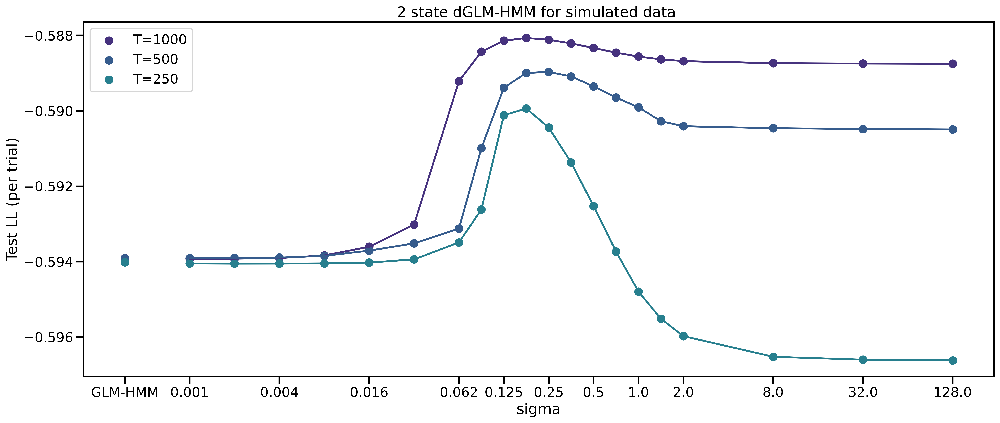

In [6]:
sigmaList = [0] + [2**x for x in list(np.arange(-10,-4,1,dtype=float))] + [2**x for x in list(np.arange(-4,1,0.5,dtype=float))] + [2**x for x in list(np.arange(1,8,2,dtype=float))]
fig, axes = plt.subplots(1, figsize = (20,8), dpi=400)
testLl = np.zeros((3,len(sigmaList)))
sessInd10000 = []
for sess in range(0,S+1):
    sessInd10000.append(sess*1000)
testLl1 = evaluate_multiple_sigmas_simulated(N=10000,K=K,D=D,C=C, trainSessInd=sessInd10000, testSessInd=testSessInd, sigmaList = sigmaList, modelType='constant-drift', save=False)
testLl[0,:] = testLl1[0,:]
#sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl1[:,0:len(sigmaList)], axes=axes, title='2 state dGLM-HMM - simulated data ', labels=None, save_fig=False)

sessInd5000 = []
for sess in range(0,S+1):
    sessInd5000.append(sess*500)
testLl2 = evaluate_multiple_sigmas_simulated(N=5000,K=K,D=D,C=C, trainSessInd=sessInd5000, testSessInd=testSessInd, sigmaList = sigmaList, modelType='constant-drift', save=False)
testLl[1,:] = testLl2[0,:]
#sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl2[:,0:len(sigmaList)], axes=axes, title='2 state dGLM-HMM - simulated data ', labels=None, save_fig=False)

sessInd2500 = []
for sess in range(0,S+1):
    sessInd2500.append(sess*250)
testLl3 = evaluate_multiple_sigmas_simulated(N=2500,K=K,D=D,C=C, trainSessInd=sessInd2500, testSessInd=testSessInd, sigmaList = sigmaList, modelType='constant-drift', save=False)
testLl[2,:] = testLl3[0,:]
#sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl3[:,0:len(sigmaList)], axes=axes, title='2 state dGLM-HMM - simulated data ', labels=None, save_fig=False)

sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl, axes=axes, title='2 state dGLM-HMM for simulated data ', labels=['T=1000','T=500','T=250'], save_fig=True)

# sessInd1000 = []
# for sess in range(0,S+1):
#     sessInd1000.append(sess*100)
# testLl2 = evaluate_multiple_sigmas_simulated(N=1000,K=K,D=D,C=C, trainSessInd=sessInd1000, testSessInd=testSessInd, sigmaList = sigmaList, modelType='constant-drift', save=False)
# sigma_testLl_plot(K=2, sigmaList=sigmaList, testLl=testLl2[:,0:len(sigmaList)], axes=axes, title='2 state dGLM-HMM - simulated data ', labels=None, save_fig=False)


In [ ]:
# Checking gradient function 

# import numdifftools as nd
# phi = dGLM_HMM.observation_probability(trainX, trueW)
# alphaSess, ctSess, llSess = dGLM_HMM.forward_pass(trainY[sessInd[8]:sessInd[9]], trueP, phi[sessInd[8]:sessInd[9],:,:], pi0=None)
# betaSess = dGLM_HMM.backward_pass(trainY[sessInd[8]:sessInd[9]], trueP, phi[sessInd[8]:sessInd[9],:,:], ctSess, pi0=None)
# gammaSess, zetaSess = dGLM_HMM.posteriorLatents(trainY[sessInd[8]:sessInd[9]], trueP, phi[sessInd[8]:sessInd[9],:,:], alphaSess, betaSess, ctSess)

# prevW = trueW[sessInd[7],0,:,:] # k x d x c matrix of previous session weights
# nextW = trueW[sessInd[9],0,:,:]
# w_flat = np.ndarray.flatten(trueW[sessInd[8],0,:,1])
# sigma=reshapeSigma(1, K, D)
# f = lambda w: dGLM_HMM.value_weight_loss_function(w, trainX[sessInd[8]:sessInd[9]], trainY[sessInd[8]:sessInd[9]], gammaSess[:,0], prevW, nextW, sigma[0,:])
# g = lambda w: dGLM_HMM.grad_weight_loss_function(w, trainX[sessInd[8]:sessInd[9]], trainY[sessInd[8]:sessInd[9]], gammaSess[:,0], prevW, nextW, sigma[0,:])
# print(check_grad(f,g,w_flat))

# prevW = trueW[sessInd[7],1,:,:] # k x d x c matrix of previous session weights
# nextW = trueW[sessInd[9],1,:,:]
# w_flat = np.ndarray.flatten(trueW[sessInd[8],1,:,1])
# sigma=reshapeSigma(1, K, D)
# f = lambda w: dGLM_HMM.value_weight_loss_function(w, trainX[sessInd[8]:sessInd[9]], trainY[sessInd[8]:sessInd[9]], gammaSess[:,1], prevW, nextW, sigma[1,:])
# g = lambda w: dGLM_HMM.grad_weight_loss_function(w, trainX[sessInd[8]:sessInd[9]], trainY[sessInd[8]:sessInd[9]], gammaSess[:,1], prevW, nextW, sigma[1,:])
# print(check_grad(f,g,w_flat))